In [1]:
# Importing ML Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
# import the  data set
data_path = '..\data\processed\Concrete_Data.csv'
data = pd.read_csv(data_path)

In [3]:
# Explore the data set
data.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


In [4]:
data.tail()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.18
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.70
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.77
1029,260.9,100.5,78.3,200.6,8.6,864.5,761.5,28,32.40


In [5]:
# Explore data description and information
data.describe()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
Cement                           1030 non-null float64
Blast Furnace Slag               1030 non-null float64
Fly Ash                          1030 non-null float64
Water                            1030 non-null float64
Superplasticizer                 1030 non-null float64
Coarse Aggregate                 1030 non-null float64
Fine Aggregate                   1030 non-null float64
Age                              1030 non-null int64
Concrete compressive strength    1030 non-null float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


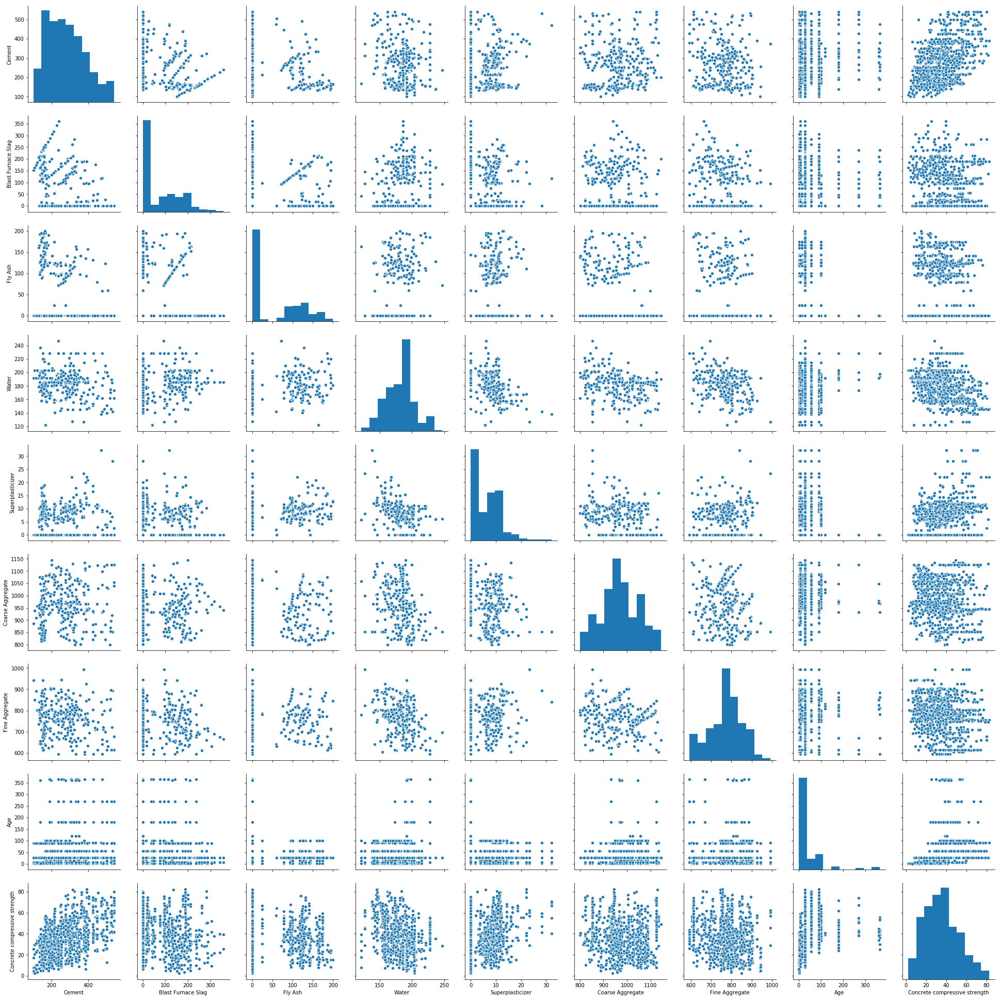

In [7]:
sns.pairplot(data, height = 3)
plt.show()

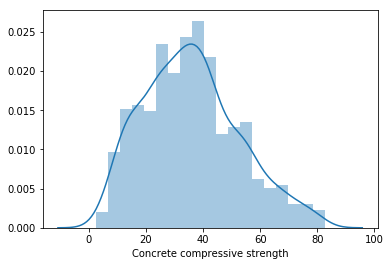

In [8]:
sns.distplot(data['Concrete compressive strength'])

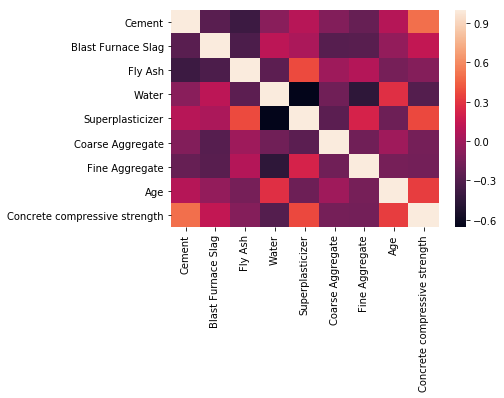

In [9]:
# Correlation plot
sns.heatmap(data.corr())

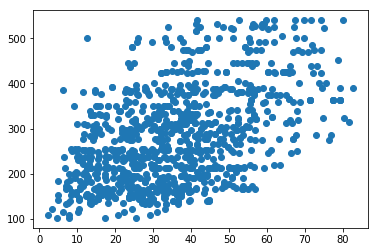

In [10]:
plt.scatter(data['Concrete compressive strength'], data['Cement'])

plt.show();

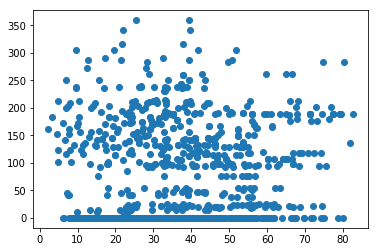

In [11]:
plt.scatter(data['Concrete compressive strength'], data['Blast Furnace Slag'])

plt.show();

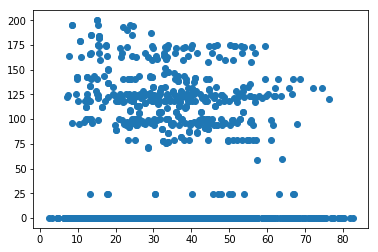

In [12]:
plt.scatter(data['Concrete compressive strength'], data['Fly Ash'])

plt.show()


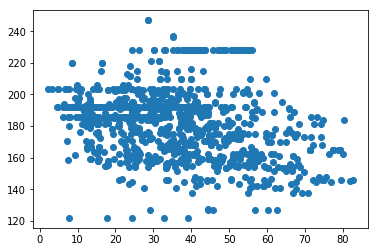

In [13]:
plt.scatter(data['Concrete compressive strength'], data['Water'])

plt.show()


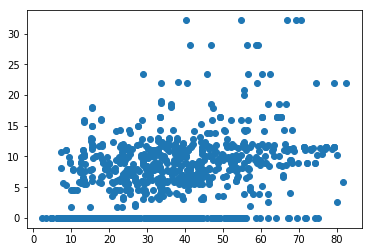

In [14]:
plt.scatter(data['Concrete compressive strength'], data['Superplasticizer'])

plt.show()


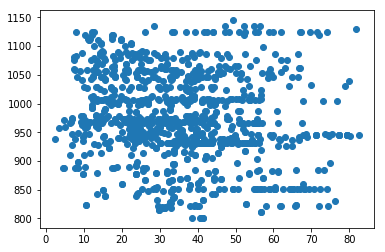

In [15]:
plt.scatter(data['Concrete compressive strength'], data['Coarse Aggregate'])

plt.show()

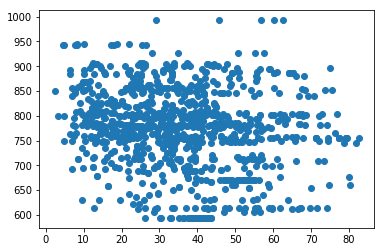

In [16]:
plt.scatter(data['Concrete compressive strength'], data['Fine Aggregate'])

plt.show()

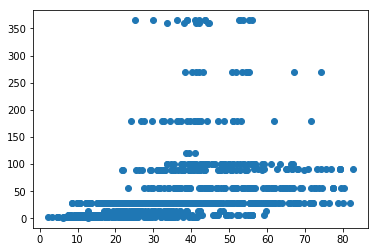

In [17]:
plt.scatter(data['Concrete compressive strength'], data['Age'])

plt.show()

## Spliting the data into training and test sets

In [18]:
data.columns

Index(['Cement', 'Blast Furnace Slag', 'Fly Ash', 'Water', 'Superplasticizer',
       'Coarse Aggregate', 'Fine Aggregate', 'Age',
       'Concrete compressive strength'],
      dtype='object')

In [19]:
X = data[['Cement', 'Blast Furnace Slag', 'Fly Ash', 'Water',
       'Superplasticizer',
       'Coarse Aggregate',
       'Fine Aggregate', 'Age']]

y = data['Concrete compressive strength']

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)

In [21]:
#standardizing our data
from sklearn.preprocessing import StandardScaler

s_scaler = StandardScaler()

X_train = s_scaler.fit_transform(X_train.astype(np.float))

X_test = s_scaler.transform(X_test.astype(np.float))

# Multiple Linear Regression

In [22]:
# importing Linear Regression Algorithm
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()

In [23]:
lin_reg.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [24]:
print("Training Score: {}".format(lin_reg.score(X_train, y_train) *100) + " %")

Training Score: 60.425494462483385 %


In [25]:
y_pred = lin_reg.predict(X_test)

In [26]:
from sklearn.metrics import r2_score

test_score = r2_score(y_test, y_pred)

print("Testing Score: {}".format(test_score *100) + " %")

Testing Score: 61.70442350962302 %


# Polynomial Regression

In [27]:
# Creating quadratic and cubic features
from sklearn.preprocessing import PolynomialFeatures

quad_poly = PolynomialFeatures(degree = 2)
cube_poly = PolynomialFeatures(degree = 3)

quad_features = quad_poly.fit_transform(X_train)
cube_features =  cube_poly.fit_transform(X_train)

## Quadratic Polynomial

In [28]:
# Fitting quadratic features to linear regression algorithm
lin_reg_quad = lin_reg.fit(quad_features, y_train)

test_score = lin_reg_quad.predict(quad_poly.fit_transform(X_test))

quadratic_r2 = r2_score(y_test, test_score)

In [29]:
# Print training and test score
print("Training Score for the quadratic polynomial model is: {}".format((lin_reg_quad.score(quad_features, y_train) *100).round(3)) + " %")


Training Score for the quadratic polynomial model is: 80.665 %


## Cubic Polynomials

In [30]:
lin_reg_cube = lin_reg.fit(cube_features, y_train)
cube_test_score = lin_reg_cube.predict(cube_poly.fit_transform(X_test))
cubic_r2 = r2_score(y_test, test_score)

In [31]:
# Print training and test score
print("Training Score for the Cubic polynomial model is: {}".format((lin_reg_cube.score(cube_features, y_train) *100).round(3)) + " %")


Training Score for the Cubic polynomial model is: 93.492 %


# Support Vector Regression

In [32]:
from sklearn.svm import SVR
svr_model =  SVR()
svr_model.fit(X_train, y_train)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [33]:
y_svr_pred = svr_model.predict(X_test)

In [34]:
svr_test_score = r2_score(y_test, y_svr_pred)

print("Testing Score: {}".format(svr_test_score *100) + " %")

Testing Score: 60.36223668588472 %


# KNN Regressor

In [35]:
# import and instantiate the KNN alopgrithm
from sklearn.neighbors import KNeighborsRegressor

knn_regressor=KNeighborsRegressor()



In [36]:
knn_regressor.fit(X_train,y_train) 

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform')

In [37]:
y_knn_pred = knn_regressor.predict(X_test)

In [38]:
knn_test_score = r2_score(y_test, y_knn_pred)

print("Testing Score: {}".format(knn_test_score *100) + " %")

Testing Score: 71.23240108173064 %


# Decision Trees

In [39]:
# Importing and instantiating decission tree algorithm
from sklearn.tree import DecisionTreeRegressor

dec_tree = DecisionTreeRegressor(max_depth=3, min_samples_leaf=0.13, random_state=3)


In [40]:
dec_tree.fit(X_train, y_train)

DecisionTreeRegressor(criterion='mse', max_depth=3, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=0.13,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=3, splitter='best')

In [41]:
y_dec_pred = dec_tree.predict(X_test)

In [42]:
dec_test_score = r2_score(y_test, y_dec_pred)

print("Testing Score: {}".format(dec_test_score *100) + " %")

Testing Score: 53.64968558387848 %


## Using Random Forests

In [68]:
from sklearn.ensemble import RandomForestRegressor

rfc = RandomForestRegressor(n_estimators=600, min_samples_leaf=1, oob_score=True, n_jobs=-1)

In [69]:
rfc.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=600, n_jobs=-1,
           oob_score=True, random_state=None, verbose=0, warm_start=False)

In [70]:
y_rfc_pred = rfc.predict(X_test)

In [71]:
rfc_test_score = r2_score(y_test, y_rfc_pred)

print("Testing Score: {}".format(rfc_test_score *100) + " %")

Testing Score: 89.98968413319976 %


# Regularized Regression Models

## We shall tune the Hyperparameters to see if we ca improve the performance of our models

    Using the grid searh and LASSO and Elastic net algorithms

# Lasso Regression

In [43]:
from sklearn.linear_model import Lasso

In [44]:
lasso_model = Lasso()
parameter_grid = {'alpha': [0.1, 0.3, 0.5, 0.6, 0.8, 1, 1.2 ]}
from sklearn.model_selection import GridSearchCV

gs_cv = GridSearchCV(lasso_model, parameter_grid, cv=10, n_jobs=4)


gs_cv.fit(X_train, y_train)

print(gs_cv.best_params_)


{'alpha': 0.1}
C:\Users\stg\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [45]:
print(gs_cv.best_estimator_)

Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)


In [46]:
for i in range(len(parameter_grid['alpha'])):
    print('Parameters: ', gs_cv.cv_results_['params'][i])

    print('Mean Testing Score: ', gs_cv.cv_results_['mean_test_score'][i])
    
    print('Rank: ', gs_cv.cv_results_['rank_test_score'][i])

Parameters:  {'alpha': 0.1}
Mean Testing Score:  0.5720922455483776
Rank:  1
Parameters:  {'alpha': 0.3}
Mean Testing Score:  0.5696733099974193
Rank:  2
Parameters:  {'alpha': 0.5}
Mean Testing Score:  0.5628420326269697
Rank:  3
Parameters:  {'alpha': 0.6}
Mean Testing Score:  0.5577760634830609
Rank:  4
Parameters:  {'alpha': 0.8}
Mean Testing Score:  0.5443260536414202
Rank:  5
Parameters:  {'alpha': 1}
Mean Testing Score:  0.5295241311004523
Rank:  6
Parameters:  {'alpha': 1.2}
Mean Testing Score:  0.520600920524471
Rank:  7


In [47]:
pd.set_option('display.max_columns', None) 

print('All the properties in one DataFrame;')

# Read the cv_results property into a dataframe & print it out
cv_results_df = pd.DataFrame(gs_cv.cv_results_)
print(cv_results_df)

print('\n')
print('Column with a dictionary of all hyperparameters used;')

# Extract and print the column with a dictionary of hyperparameters used
column = cv_results_df.loc[:, ["params"]]
print(column)

All the properties in one DataFrame;
   mean_fit_time  std_fit_time  mean_score_time  std_score_time param_alpha  \
0       0.086557      0.098541         0.005104        0.010051         0.1   
1       0.014360      0.026336         0.000851        0.000229         0.3   
2       0.016211      0.028481         0.000901        0.000436         0.5   
3       0.003052      0.003826         0.010707        0.026895         0.6   
4       0.001801      0.000458         0.000750        0.000250         0.8   
5       0.001751      0.000461         0.000750        0.000250           1   
6       0.002101      0.001068         0.000851        0.000229         1.2   

           params  split0_test_score  split1_test_score  split2_test_score  \
0  {'alpha': 0.1}           0.517906           0.646451           0.702367   
1  {'alpha': 0.3}           0.518036           0.638517           0.685069   
2  {'alpha': 0.5}           0.514480           0.625806           0.664923   
3  {'alpha': 0.6} 

In [48]:
print('Select the estimator with the best combination and print out the properties;')

# Extract and print the row that had the best mean test score
best_row = cv_results_df[cv_results_df["rank_test_score"] == 1]
print(best_row)

Select the estimator with the best combination and print out the properties;
   mean_fit_time  std_fit_time  mean_score_time  std_score_time param_alpha  \
0       0.086557      0.098541         0.005104        0.010051         0.1   

           params  split0_test_score  split1_test_score  split2_test_score  \
0  {'alpha': 0.1}           0.517906           0.646451           0.702367   

   split3_test_score  split4_test_score  split5_test_score  split6_test_score  \
0           0.349783           0.730683           0.680552           0.556089   

   split7_test_score  split8_test_score  split9_test_score  mean_test_score  \
0           0.536561            0.45351           0.544666         0.572092   

   std_test_score  rank_test_score  split0_train_score  split1_train_score  \
0        0.113261                1            0.612563            0.595537   

   split2_train_score  split3_train_score  split4_train_score  \
0            0.590022            0.623898            0.586082  

In [49]:
lasso_reg = Lasso(alpha=gs_cv.best_params_['alpha']).fit(X_train, y_train)

y_pred = lasso_reg.predict(X_test)

print('Training score is', (lasso_reg.score(X_train, y_train)* 100).round(3) , "%")
print('Test score is', (r2_score(y_test, y_pred)* 100).round(3) , " %")

Training score is 60.367 %
Test score is 61.398  %


# Elastic Net

In [50]:
from sklearn.linear_model import ElasticNet

In [51]:

elastic_net_lasso_ = ElasticNet(normalize=False, max_iter=100000, warm_start=True)
 
parameter_grid = {'alpha':[0.1, 0.3, 0.5, 0.6, 0.8, 1, 1.2, 1.5, 1.7, 1.8, 2.0, 2.4 ]}

from sklearn.model_selection import GridSearchCV
gs_cv = GridSearchCV(elastic_net_lasso_, parameter_grid, cv=10, n_jobs=4)

gs_cv.fit(X_train, y_train)
print(gs_cv.best_params_)


{'alpha': 0.1}
C:\Users\stg\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [76]:
#mean_test_score of the best row
print('Mean Testing Score: ', gs_cv.cv_results_['mean_test_score'])


Mean Testing Score:  [0.56815673 0.55225432 0.53296853 0.52276508 0.50071443 0.4776384
 0.45429182 0.42013405 0.3982979  0.38770872 0.36721868 0.32900441]


In [74]:
elastic_net_reg = Lasso(alpha=gs_cv.best_params_['alpha']).fit(X_train, y_train)

y_pred = elastic_net_reg.predict(X_test)

print('Training score is', (elastic_net_reg.score(X_train, y_train)* 100).round(3) , " %")

print('Test score is', (r2_score(y_test, y_pred)* 100).round(3) , " %")

Training score is 60.367  %
Test score is 61.398  %
